<a href="https://colab.research.google.com/github/IGPTsewwandi/Image-Processing-Based-Smart-Waste-Management-System-/blob/feature%2Fclassification/waste_item_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import glob
import random
import shutil

# Load dataset
RAW_DIR = "/content/drive/MyDrive/dataset-resized"
OUT_DIR = "/content/drive/MyDrive/dataset-resized/splited"

# Split dataset (train:val:test = 70:15:15)
CATEGORIES = ['cardboard','glass','metal','paper','plastic']

# Create output directories
for split in ['train','val','test']:
    for cat in CATEGORIES:
        os.makedirs(os.path.join(OUT_DIR, split, cat), exist_ok=True)

# Ratios
train_ratio, val_ratio, test_ratio = 0.7, 0.15, 0.15

for cat in CATEGORIES:
    files = glob.glob(os.path.join(RAW_DIR, cat, "*.*"))
    random.shuffle(files)

    n_total = len(files)
    n_train = int(train_ratio * n_total)
    n_val = int(val_ratio * n_total)

    train_files = files[:n_train]
    val_files   = files[n_train:n_train+n_val]
    test_files  = files[n_train+n_val:]

    # Copy
    for f in train_files:
        shutil.copy(f, os.path.join(OUT_DIR, 'train', cat))
    for f in val_files:
        shutil.copy(f, os.path.join(OUT_DIR, 'val', cat))
    for f in test_files:
        shutil.copy(f, os.path.join(OUT_DIR, 'test', cat))

    print(f"{cat}: Train={len(train_files)}, Val={len(val_files)}, Test={len(test_files)}")


cardboard: Train=282, Val=60, Test=61
glass: Train=350, Val=75, Test=76
metal: Train=287, Val=61, Test=62
paper: Train=415, Val=89, Test=90
plastic: Train=337, Val=72, Test=73


In [ ]:
# Preprocessing & Augmentation
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (224,224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    os.path.join(OUT_DIR,'train'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_data = val_datagen.flow_from_directory(
    os.path.join(OUT_DIR,'val'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_data = test_datagen.flow_from_directory(
    os.path.join(OUT_DIR,'test'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


Found 1671 images belonging to 5 classes.
Found 357 images belonging to 5 classes.
Found 362 images belonging to 5 classes.


In [ ]:
# Build Model (MobileNetV2)
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout

base_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')
base_model.trainable = False  # freeze base

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
output = Dense(len(CATEGORIES), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,264,389 (8.64 MB)

 Trainable params: 6,405 (25.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Train
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint = ModelCheckpoint("best_model.h5", save_best_only=True, monitor='val_accuracy', mode='max')
early = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=15,
    callbacks=[checkpoint, early]
)


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3666 - loss: 1.6238

53/53 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.3684 - loss: 1.6190 - val_accuracy: 0.6835 - val_loss: 0.7956
Epoch 2/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6041 - loss: 0.9890

53/53 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.6049 - loss: 0.9875 - val_accuracy: 0.7227 - val_loss: 0.6484
Epoch 3/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7051 - loss: 0.7752

53/53 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.7050 - loss: 0.7750 - val_accuracy: 0.7591 - val_loss: 0.5971
Epoch 4/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7346 - loss: 0.6695

53/53 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - accuracy: 0.7346 - loss: 0.6695 - val_accuracy: 0.7815 - val_loss: 0.5629
Epoch 5/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 116s 2s/step - accuracy: 0.7686 - loss: 0.5906 - val_accuracy: 0.7675 - val_loss: 0.5583
Epoch 6/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7903 - loss: 0.5654

53/53 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.7902 - loss: 0.5654 - val_accuracy: 0.7899 - val_loss: 0.5485
Epoch 7/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7823 - loss: 0.5615

53/53 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.7823 - loss: 0.5616 - val_accuracy: 0.8067 - val_loss: 0.5208
Epoch 8/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7899 - loss: 0.5333

53/53 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.7901 - loss: 0.5333 - val_accuracy: 0.8123 - val_loss: 0.4932
Epoch 9/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.8112 - loss: 0.4903 - val_accuracy: 0.8123 - val_loss: 0.5100
Epoch 10/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.8192 - loss: 0.5144 - val_accuracy: 0.8067 - val_loss: 0.4873
Epoch 11/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8117 - loss: 0.4676

53/53 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.8118 - loss: 0.4678 - val_accuracy: 0.8151 - val_loss: 0.4816
Epoch 12/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 117s 2s/step - accuracy: 0.8189 - loss: 0.4932 - val_accuracy: 0.8095 - val_loss: 0.4810
Epoch 13/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.8121 - loss: 0.4968 - val_accuracy: 0.8095 - val_loss: 0.4781
Epoch 14/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.8260 - loss: 0.4394 - val_accuracy: 0.8151 - val_loss: 0.4613
Epoch 15/15
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8092 - loss: 0.4744

53/53 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.8092 - loss: 0.4744 - val_accuracy: 0.8179 - val_loss: 0.4618


12/12 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.8404 - loss: 0.4315
Test Accuracy: 84.25%
12/12 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step
              precision    recall  f1-score   support

   cardboard       0.96      0.85      0.90        61
       glass       0.81      0.79      0.80        76
       metal       0.73      0.90      0.81        62
       paper       0.89      0.92      0.91        90
     plastic       0.84      0.74      0.79        73

    accuracy                           0.84       362
   macro avg       0.85      0.84      0.84       362
weighted avg       0.85      0.84      0.84       362



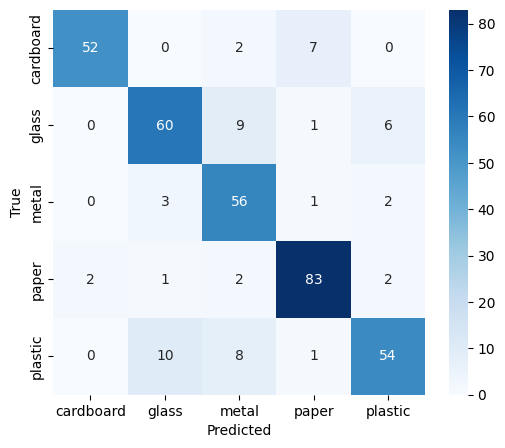

In [ ]:
# Evaluate on Test Set
loss, acc = model.evaluate(test_data)
print(f"Test Accuracy: {acc*100:.2f}%")

# Confusion Matrix
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

preds = model.predict(test_data)
y_pred = np.argmax(preds, axis=1)
y_true = test_data.classes
labels = list(test_data.class_indices.keys())

print(classification_report(y_true, y_pred, target_names=labels))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


In [ ]:
# Predict Single Image
from tensorflow.keras.preprocessing import image

def predict_image(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array)
    idx = np.argmax(prediction)
    return labels[idx]

print(predict_image("/content/drive/MyDrive/dataset-resized/trash/trash121.jpg"))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
glass


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


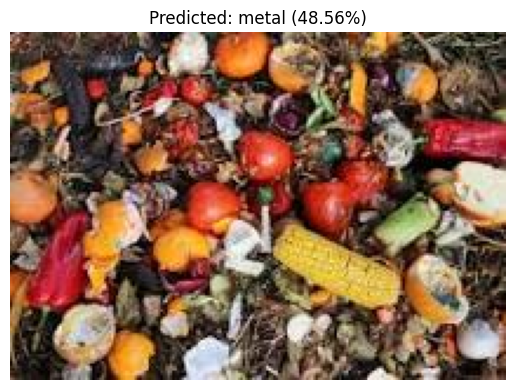

'metal'

In [ ]:
# Predict Single Image and Show
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_and_show(img_path):
    # Load image
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Prediction
    prediction = model.predict(img_array)
    idx = np.argmax(prediction)
    label = labels[idx]
    confidence = prediction[0][idx]

    # Show image with prediction
    plt.imshow(image.load_img(img_path))
    plt.axis('off')
    plt.title(f"Predicted: {label} ({confidence*100:.2f}%)")
    plt.show()

    return label

# Example usage
predict_and_show("/content/download.jpeg")


Found 137 test images.


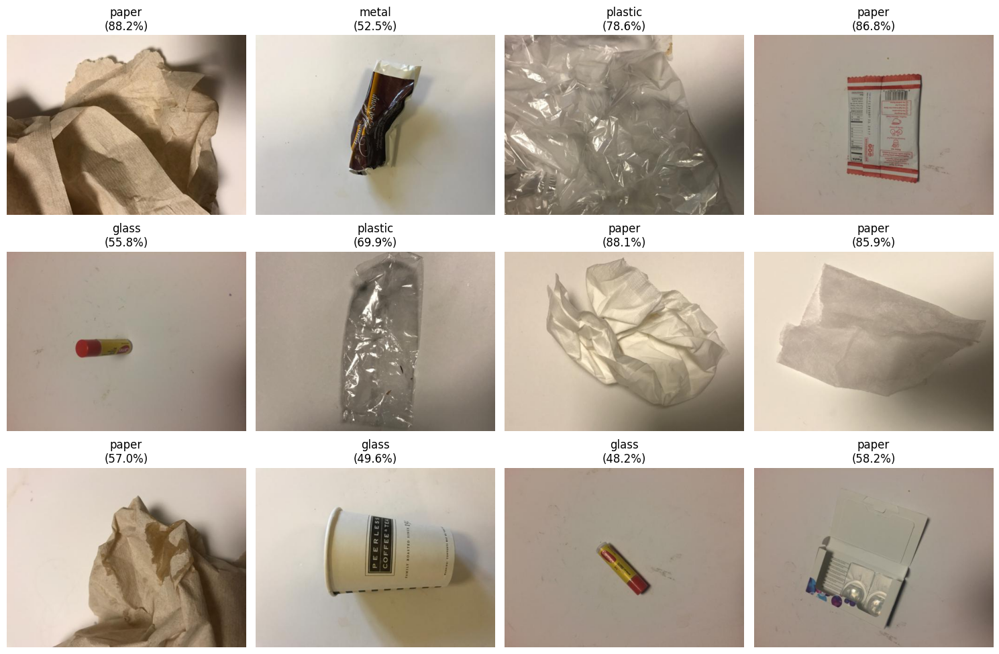

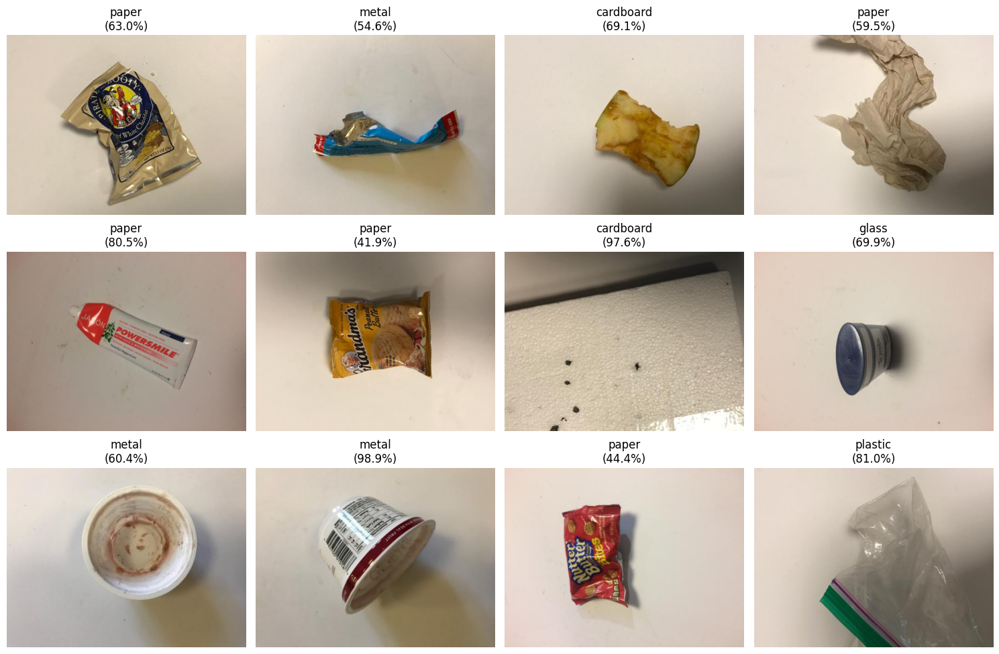

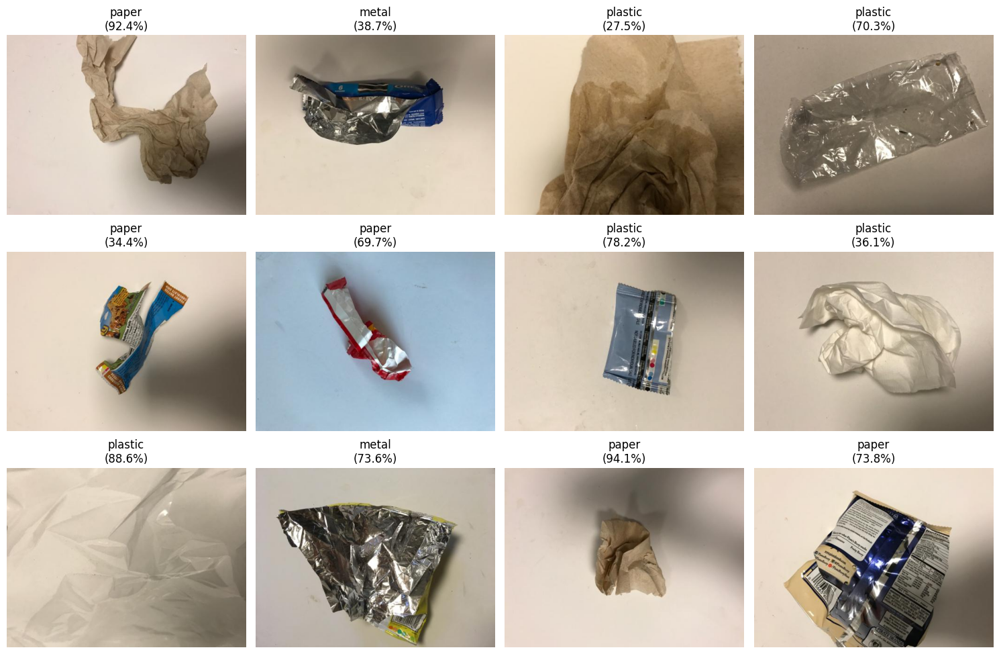

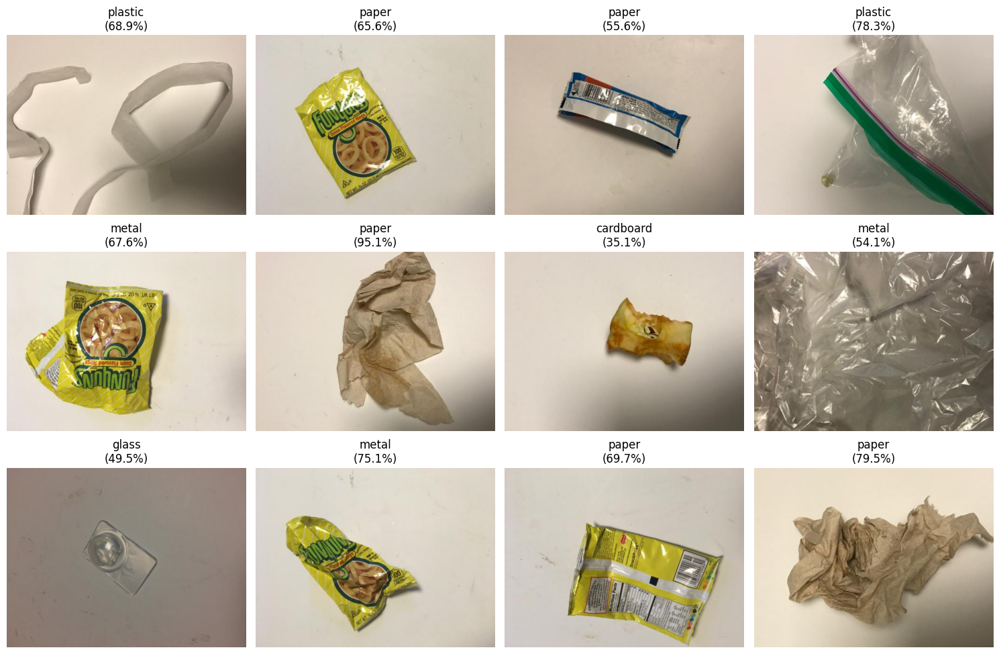

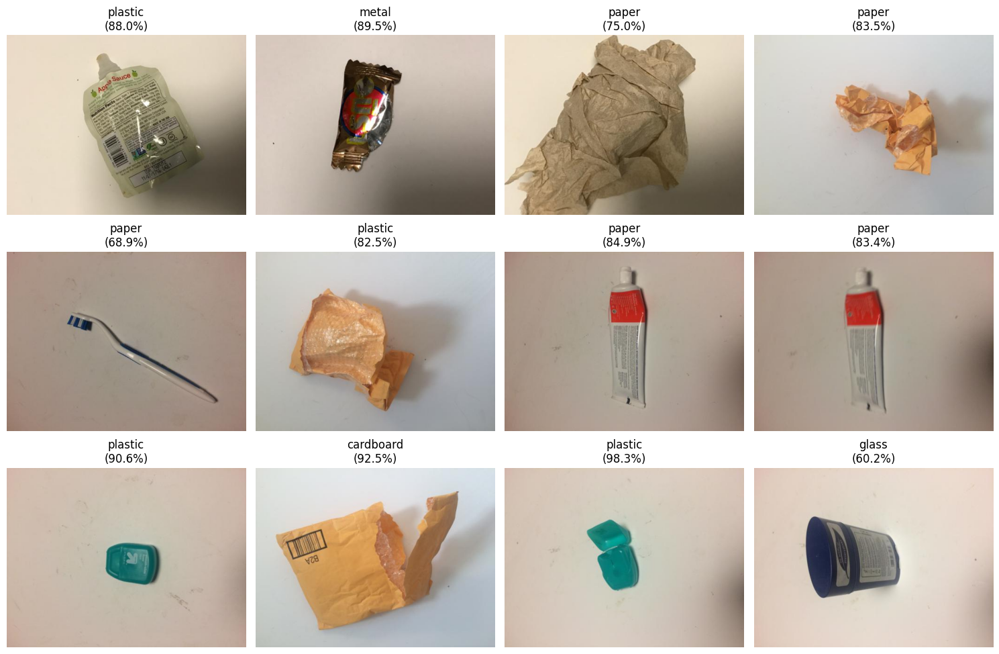

...

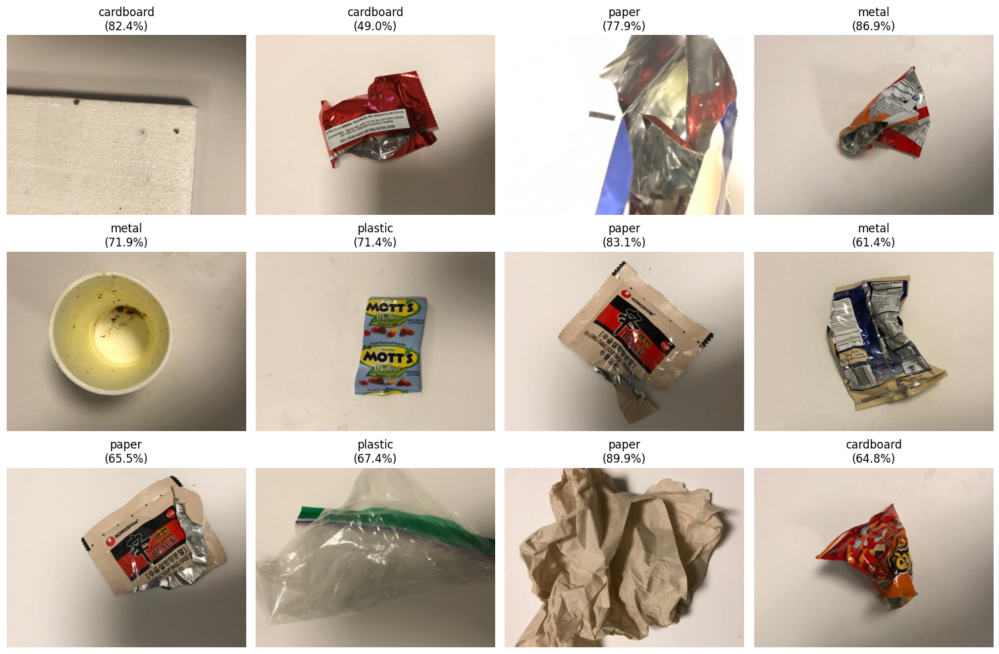

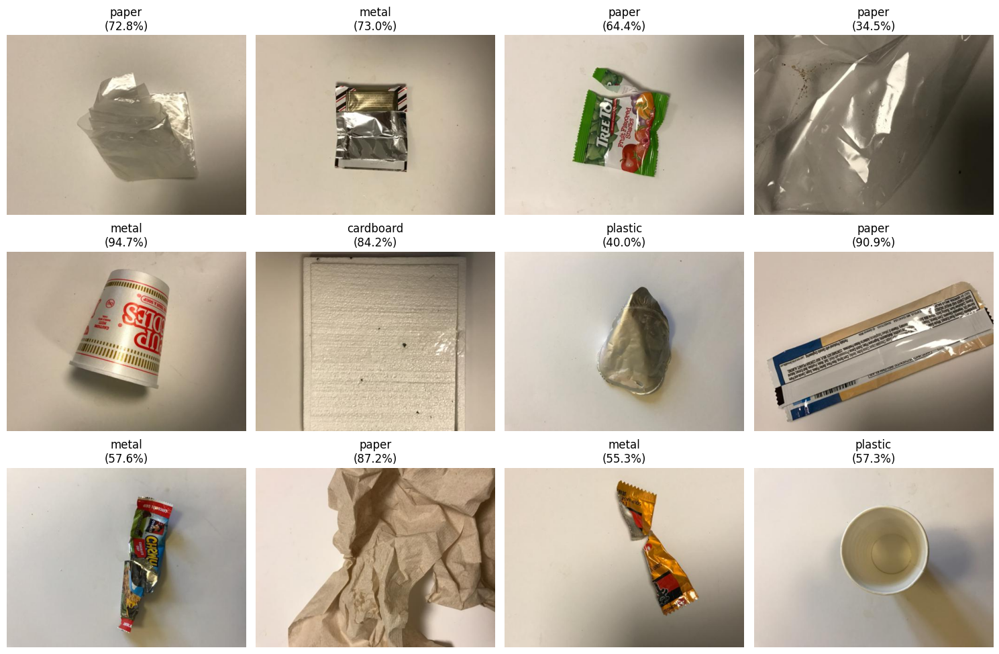

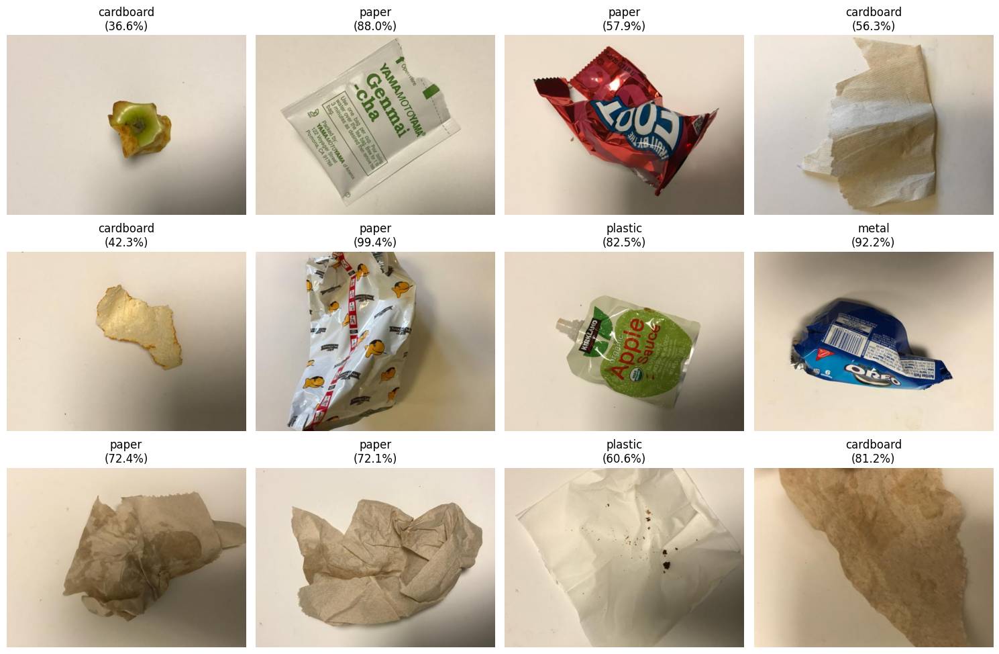

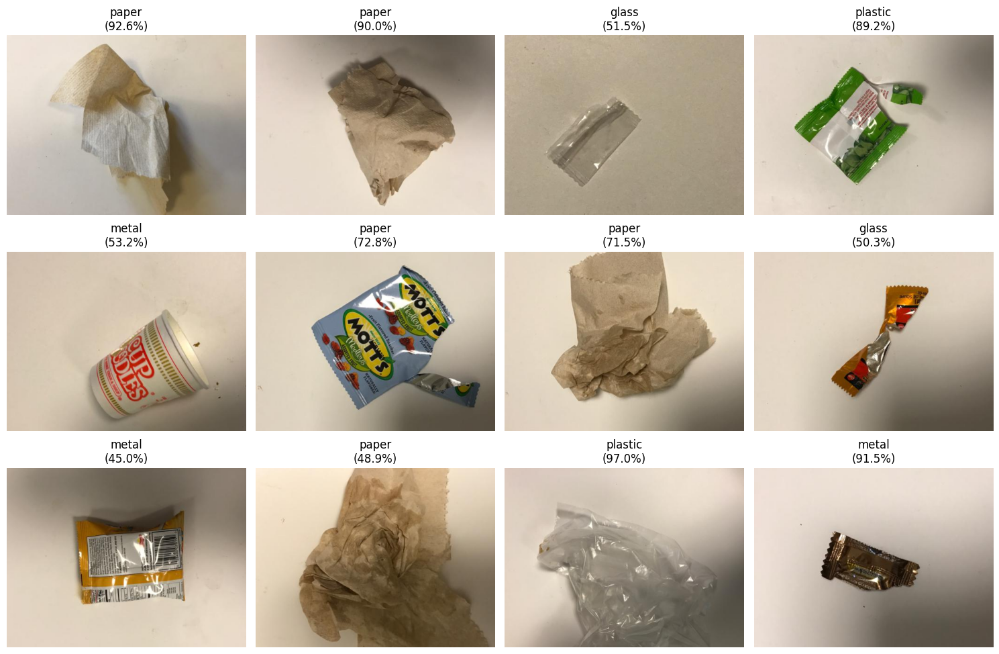

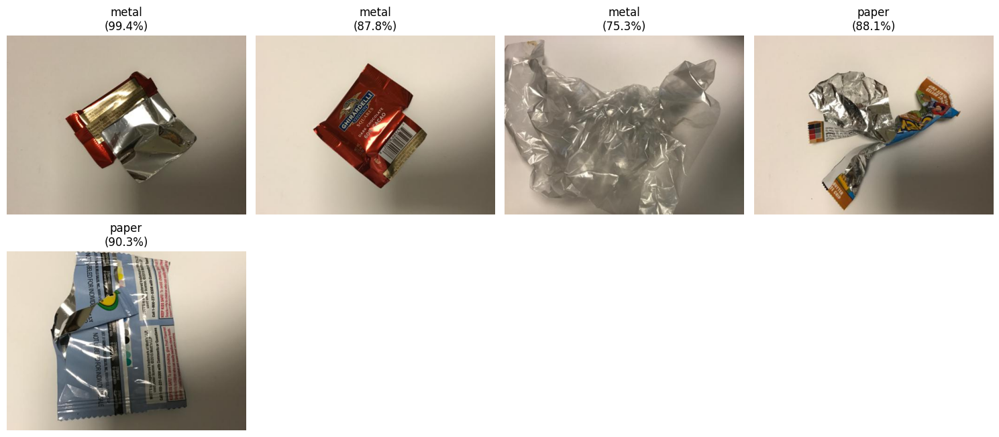

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image

def predict_and_show_all(test_folder, batch_size=12):
    # Collect all test images (all categories)
    img_paths = []
    for root, dirs, files in os.walk(test_folder):
        for f in files:
            if f.lower().endswith(('.jpg','.png','.jpeg')):
                img_paths.append(os.path.join(root, f))

    print(f"Found {len(img_paths)} test images.")

    # Loop through all images in batches
    for start in range(0, len(img_paths), batch_size):
        batch_paths = img_paths[start:start+batch_size]
        plt.figure(figsize=(15, 10))

        for i, img_path in enumerate(batch_paths):
            # Load + preprocess
            img = image.load_img(img_path, target_size=IMG_SIZE)
            img_array = image.img_to_array(img) / 255.0
            img_array = np.expand_dims(img_array, axis=0)

            # Predict
            prediction = model.predict(img_array, verbose=0)
            idx = np.argmax(prediction)
            label = labels[idx]
            confidence = prediction[0][idx]

            # Plot
            plt.subplot(3, 4, i+1)   # 3 rows x 4 columns = 12 images
            plt.imshow(image.load_img(img_path))
            plt.axis('off')
            plt.title(f"{label}\n({confidence*100:.1f}%)")

        plt.tight_layout()
        plt.show()

# Run on entire test dataset
predict_and_show_all("/content/drive/MyDrive/dataset-resized/trash", batch_size=12)


glass: 501 files
metal: 410 files
cardboard: 403 files
paper: 594 files
plastic: 482 files


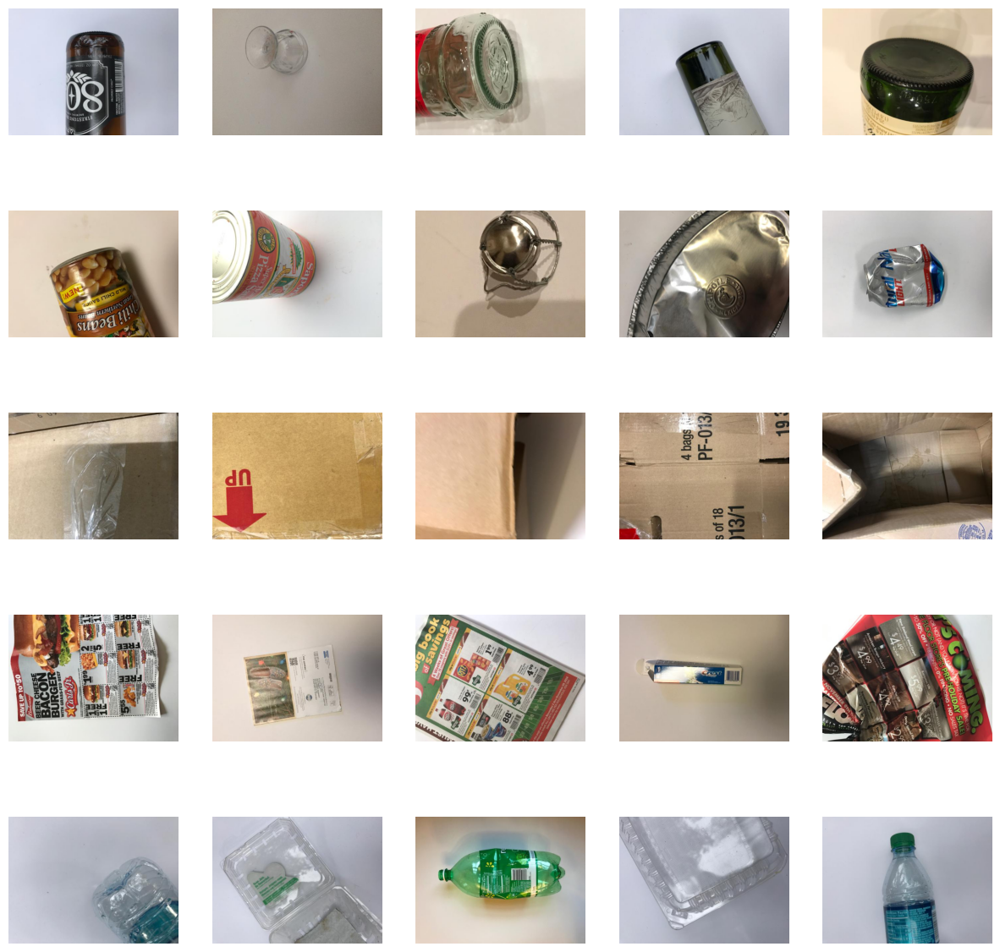

Corrupt files: 0
Small files (<32px): 0


In [ ]:
import os, glob, random, shutil, hashlib
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
RAW_DIR = "/content/drive/MyDrive/dataset-resized"
OUT_DIR = "/content/drive/MyDrive/dataset-resized/splited"       # created dataset (train/val/test)

CATEGORIES = ['glass','metal','cardboard','paper','plastic']
for cat in CATEGORIES:
    files = glob.glob(os.path.join(RAW_DIR, cat, "*.*"))
    print(f"{cat}: {len(files)} files")

# Quick sample plot (shows up to 5 images per class)
def show_samples_per_class(n=5):
    plt.figure(figsize=(15,3*len(CATEGORIES)))
    for i,cat in enumerate(CATEGORIES):
        files = glob.glob(os.path.join(RAW_DIR,cat,"*.*"))[:n]
        for j,f in enumerate(files):
            plt.subplot(len(CATEGORIES), n, i*n + j + 1)
            try:
                img = Image.open(f).convert('RGB')
                plt.imshow(img); plt.axis('off')
            except Exception as e:
                plt.title("Corrupt")
    plt.show()

show_samples_per_class(5)

# Detect corrupted or extremely small images and show them
corrupt = []
small = []
for cat in CATEGORIES:
    for f in glob.glob(os.path.join(RAW_DIR,cat,"*.*")):
        try:
            img = Image.open(f)
            w,h = img.size
            if min(w,h) < 32:
                small.append(f)
        except Exception as e:
            corrupt.append(f)

print("Corrupt files:", len(corrupt))
print("Small files (<32px):", len(small))


In [ ]:
# move corrupt/small to a 'bad' folder
bad_dir = os.path.join(RAW_DIR, "_bad_files")
os.makedirs(bad_dir, exist_ok=True)
for f in corrupt + small:
    shutil.move(f, bad_dir)
print("Moved bad files to", bad_dir)


Moved bad files to /content/drive/MyDrive/dataset-resized/_bad_files


In [ ]:
# Check duplicates across classes (hash-based)
def file_md5(path):
    h = hashlib.md5()
    with open(path,'rb') as f:
        h.update(f.read())
    return h.hexdigest()

hash_map = {}
duplicates = []
for cat in CATEGORIES:
    for f in glob.glob(os.path.join(RAW_DIR,cat,"*.*")):
        h = file_md5(f)
        if h in hash_map and hash_map[h] != f:
            duplicates.append((f, hash_map[h]))
        else:
            hash_map[h] = f

print("Duplicate count (same file hashed twice):", len(duplicates))


Duplicate count (same file hashed twice): 3


In [ ]:
# 2. Split (create train/val/test)
import math
random.seed(42)
if os.path.exists(OUT_DIR):
    print("Warning: OUT_DIR exists:", OUT_DIR)  # be careful not to overwrite desired data
else:
    os.makedirs(OUT_DIR, exist_ok=True)

for split in ['train','val','test']:
    for cat in CATEGORIES:
        os.makedirs(os.path.join(OUT_DIR, split, cat), exist_ok=True)

train_ratio, val_ratio = 0.7, 0.15

for cat in CATEGORIES:
    files = glob.glob(os.path.join(RAW_DIR, cat, "*.*"))
    files = sorted(files)  # deterministic
    random.shuffle(files)
    n_total = len(files)
    n_train = int(train_ratio * n_total)
    n_val = int(val_ratio * n_total)
    train_files = files[:n_train]
    val_files = files[n_train:n_train+n_val]
    test_files = files[n_train+n_val:]
    for f in train_files:
        shutil.copy(f, os.path.join(OUT_DIR, 'train', cat))
    for f in val_files:
        shutil.copy(f, os.path.join(OUT_DIR, 'val', cat))
    for f in test_files:
        shutil.copy(f, os.path.join(OUT_DIR, 'test', cat))
    print(f"{cat}: train {len(train_files)}, val {len(val_files)}, test {len(test_files)}")


glass: train 350, val 75, test 76
metal: train 287, val 61, test 62
cardboard: train 282, val 60, test 61
paper: train 415, val 89, test 90
plastic: train 337, val 72, test 73


In [ ]:
# ensure no same filename or file hash across splits
from collections import defaultdict
hashes_splits = defaultdict(set)
for split in ['train','val','test']:
    for f in glob.glob(os.path.join(OUT_DIR, split, '*', '*.*')):
        h = file_md5(f)
        hashes_splits[h].add(split)

leak = [h for h,s in hashes_splits.items() if len(s) > 1]
print("Number of files present in >1 split (leak):", len(leak))


Number of files present in >1 split (leak): 1131


In [ ]:
# simple grabcut-based crop and save to new folder (slow)
import cv2
import numpy as np
BG_OUT = "/content/drive/MyDrive/dataset-resized"
os.makedirs(BG_OUT, exist_ok=True)

def grabcut_save(src_path, dst_path):
    img = cv2.imread(src_path)
    h,w = img.shape[:2]
    mask = np.zeros(img.shape[:2], np.uint8)
    rect = (int(w*0.04), int(h*0.04), int(w*0.92), int(h*0.92))
    bgd = np.zeros((1,65), np.float64)
    fgd = np.zeros((1,65), np.float64)
    try:
        cv2.grabCut(img, mask, rect, bgd, fgd, 3, cv2.GC_INIT_WITH_RECT)
        mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
        img_n = img * mask2[:,:,None]
        cv2.imwrite(dst_path, img_n)
    except Exception as e:
        cv2.imwrite(dst_path, img)  # fallback

# Example usage for a single class (do selectively)
for f in glob.glob(os.path.join(OUT_DIR,'train','plastic','*.jpg'))[:50]:
     dst = f.replace(OUT_DIR, BG_OUT)
     os.makedirs(os.path.dirname(dst), exist_ok=True)
     grabcut_save(f, dst)


In [ ]:
# Data generators (MobileNetV2 preprocess)
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

IMG_SIZE = (224,224)
BATCH = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=25,
    width_shift_range=0.15,
    height_shift_range=0.15,
    brightness_range=(0.7,1.3),
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen = train_datagen.flow_from_directory(os.path.join(OUT_DIR,'train'),
                                              target_size=IMG_SIZE, batch_size=BATCH, class_mode='categorical')

val_gen = val_datagen.flow_from_directory(os.path.join(OUT_DIR,'val'),
                                          target_size=IMG_SIZE, batch_size=BATCH, class_mode='categorical', shuffle=False)

test_gen = test_datagen.flow_from_directory(os.path.join(OUT_DIR,'test'),
                                            target_size=IMG_SIZE, batch_size=BATCH, class_mode='categorical', shuffle=False)

labels = list(train_gen.class_indices.keys())
print("Class order:", train_gen.class_indices)


Found 2189 images belonging to 5 classes.
Found 658 images belonging to 5 classes.
Found 673 images belonging to 5 classes.
Class order: {'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4}


In [ ]:
# Balanced training: compute class weights if dataset imbalanced
from sklearn.utils import class_weight
import numpy as np

y_train = train_gen.classes
classes = np.unique(y_train)
cw = class_weight.compute_class_weight('balanced', classes=classes, y=y_train)
class_weights = {i: cw_val for i, cw_val in enumerate(cw)}
print("Class weights:", class_weights)


Class weights: {0: np.float64(1.1674666666666667), 1: np.float64(0.9643171806167401), 2: np.float64(1.1551451187335093), 3: np.float64(0.8062615101289135), 4: np.float64(0.9995433789954338)}


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

base = MobileNetV2(input_shape=IMG_SIZE+(3,), include_top=False, weights='imagenet')
base.trainable = False

x = base.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.4)(x)
out = Dense(len(CATEGORIES), activation='softmax')(x)
model = Model(base.input, out)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

# callbacks
checkpoint = ModelCheckpoint("best_head.h5", monitor='val_accuracy', save_best_only=True, verbose=1)
early = EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)
csvlog = CSVLogger('training_log.csv')

# Stage 1: train head
history1 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=15,
    class_weight=class_weights,
    callbacks=[checkpoint, early, reduce_lr, csvlog]
)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,264,389 (8.64 MB)

 Trainable params: 6,405 (25.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2081 - loss: 2.1388
Epoch 1: val_accuracy improved from -inf to 0.31307, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.2084 - loss: 2.1366 - val_accuracy: 0.3131 - val_loss: 1.5535 - learning_rate: 1.0000e-04
Epoch 2/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3151 - loss: 1.7191
Epoch 2: val_accuracy improved from 0.31307 to 0.47568, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 174s 3s/step - accuracy: 0.3156 - loss: 1.7176 - val_accuracy: 0.4757 - val_loss: 1.2560 - learning_rate: 1.0000e-04
Epoch 3/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4237 - loss: 1.3977
Epoch 3: val_accuracy improved from 0.47568 to 0.57143, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 200s 2s/step - accuracy: 0.4238 - loss: 1.3971 - val_accuracy: 0.5714 - val_loss: 1.0613 - learning_rate: 1.0000e-04
Epoch 4/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5251 - loss: 1.1870
Epoch 4: val_accuracy improved from 0.57143 to 0.64438, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 166s 2s/step - accuracy: 0.5252 - loss: 1.1865 - val_accuracy: 0.6444 - val_loss: 0.9319 - learning_rate: 1.0000e-04
Epoch 5/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5539 - loss: 1.1292
Epoch 5: val_accuracy improved from 0.64438 to 0.69605, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 164s 2s/step - accuracy: 0.5541 - loss: 1.1285 - val_accuracy: 0.6960 - val_loss: 0.8326 - learning_rate: 1.0000e-04
Epoch 6/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5919 - loss: 1.0329
Epoch 6: val_accuracy improved from 0.69605 to 0.72796, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.5920 - loss: 1.0327 - val_accuracy: 0.7280 - val_loss: 0.7638 - learning_rate: 1.0000e-04
Epoch 7/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6250 - loss: 0.9670
Epoch 7: val_accuracy improved from 0.72796 to 0.73860, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 201s 2s/step - accuracy: 0.6252 - loss: 0.9664 - val_accuracy: 0.7386 - val_loss: 0.7061 - learning_rate: 1.0000e-04
Epoch 8/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6752 - loss: 0.8295
Epoch 8: val_accuracy improved from 0.73860 to 0.75836, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 167s 2s/step - accuracy: 0.6752 - loss: 0.8297 - val_accuracy: 0.7584 - val_loss: 0.6631 - learning_rate: 1.0000e-04
Epoch 9/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6645 - loss: 0.8448
Epoch 9: val_accuracy improved from 0.75836 to 0.78571, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 173s 3s/step - accuracy: 0.6646 - loss: 0.8446 - val_accuracy: 0.7857 - val_loss: 0.6239 - learning_rate: 1.0000e-04
Epoch 10/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6895 - loss: 0.7943
Epoch 10: val_accuracy improved from 0.78571 to 0.79179, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 175s 3s/step - accuracy: 0.6896 - loss: 0.7941 - val_accuracy: 0.7918 - val_loss: 0.5958 - learning_rate: 1.0000e-04
Epoch 11/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6901 - loss: 0.7629
Epoch 11: val_accuracy improved from 0.79179 to 0.80395, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.6903 - loss: 0.7626 - val_accuracy: 0.8040 - val_loss: 0.5699 - learning_rate: 1.0000e-04
Epoch 12/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7316 - loss: 0.7073
Epoch 12: val_accuracy did not improve from 0.80395
69/69 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.7315 - loss: 0.7074 - val_accuracy: 0.7994 - val_loss: 0.5507 - learning_rate: 1.0000e-04
Epoch 13/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7271 - loss: 0.7103
Epoch 13: val_accuracy improved from 0.80395 to 0.81763, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.7272 - loss: 0.7099 - val_accuracy: 0.8176 - val_loss: 0.5320 - learning_rate: 1.0000e-04
Epoch 14/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7309 - loss: 0.6708
Epoch 14: val_accuracy improved from 0.81763 to 0.81915, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.7311 - loss: 0.6706 - val_accuracy: 0.8191 - val_loss: 0.5161 - learning_rate: 1.0000e-04
Epoch 15/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7319 - loss: 0.6517
Epoch 15: val_accuracy improved from 0.81915 to 0.82979, saving model to best_head.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 202s 2s/step - accuracy: 0.7321 - loss: 0.6518 - val_accuracy: 0.8298 - val_loss: 0.4967 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 15.


In [ ]:
# Stage 2: fine-tune last N layers of base
base.trainable = True
# Freeze earlier layers, unfreeze last 40 layers (tweak number)
for layer in base.layers[:-40]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

checkpoint2 = ModelCheckpoint("best_finetuned.h5", monitor='val_accuracy', save_best_only=True, verbose=1)
history2 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=15,
    class_weight=class_weights,
    callbacks=[checkpoint2, early, reduce_lr, csvlog]
)
# Save final model
model.save("waste_mobilenet_final.h5")


Epoch 1/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5976 - loss: 1.0270
Epoch 1: val_accuracy improved from -inf to 0.84043, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 237s 3s/step - accuracy: 0.5982 - loss: 1.0256 - val_accuracy: 0.8404 - val_loss: 0.4584 - learning_rate: 1.0000e-05
Epoch 2/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7105 - loss: 0.7695
Epoch 2: val_accuracy improved from 0.84043 to 0.84347, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.7106 - loss: 0.7690 - val_accuracy: 0.8435 - val_loss: 0.4302 - learning_rate: 1.0000e-05
Epoch 3/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7192 - loss: 0.7147
Epoch 3: val_accuracy improved from 0.84347 to 0.85714, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 212s 3s/step - accuracy: 0.7194 - loss: 0.7143 - val_accuracy: 0.8571 - val_loss: 0.4068 - learning_rate: 1.0000e-05
Epoch 4/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7775 - loss: 0.6122
Epoch 4: val_accuracy improved from 0.85714 to 0.86626, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 221s 3s/step - accuracy: 0.7775 - loss: 0.6119 - val_accuracy: 0.8663 - val_loss: 0.3845 - learning_rate: 1.0000e-05
Epoch 5/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7973 - loss: 0.5522
Epoch 5: val_accuracy improved from 0.86626 to 0.87234, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 227s 3s/step - accuracy: 0.7975 - loss: 0.5520 - val_accuracy: 0.8723 - val_loss: 0.3657 - learning_rate: 1.0000e-05
Epoch 6/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8036 - loss: 0.5232
Epoch 6: val_accuracy improved from 0.87234 to 0.87538, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 222s 3s/step - accuracy: 0.8037 - loss: 0.5230 - val_accuracy: 0.8754 - val_loss: 0.3472 - learning_rate: 1.0000e-05
Epoch 7/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8153 - loss: 0.4971
Epoch 7: val_accuracy improved from 0.87538 to 0.87994, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 260s 3s/step - accuracy: 0.8155 - loss: 0.4967 - val_accuracy: 0.8799 - val_loss: 0.3308 - learning_rate: 1.0000e-05
Epoch 8/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8207 - loss: 0.4709
Epoch 8: val_accuracy improved from 0.87994 to 0.88602, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 213s 3s/step - accuracy: 0.8206 - loss: 0.4708 - val_accuracy: 0.8860 - val_loss: 0.3163 - learning_rate: 1.0000e-05
Epoch 9/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8516 - loss: 0.3902
Epoch 9: val_accuracy improved from 0.88602 to 0.89666, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 223s 3s/step - accuracy: 0.8516 - loss: 0.3904 - val_accuracy: 0.8967 - val_loss: 0.3004 - learning_rate: 1.0000e-05
Epoch 10/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8640 - loss: 0.3929
Epoch 10: val_accuracy improved from 0.89666 to 0.90122, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 214s 3s/step - accuracy: 0.8640 - loss: 0.3928 - val_accuracy: 0.9012 - val_loss: 0.2899 - learning_rate: 1.0000e-05
Epoch 11/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8640 - loss: 0.3947
Epoch 11: val_accuracy improved from 0.90122 to 0.90578, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.8639 - loss: 0.3947 - val_accuracy: 0.9058 - val_loss: 0.2791 - learning_rate: 1.0000e-05
Epoch 12/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8702 - loss: 0.3400
Epoch 12: val_accuracy improved from 0.90578 to 0.91033, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 262s 3s/step - accuracy: 0.8701 - loss: 0.3403 - val_accuracy: 0.9103 - val_loss: 0.2643 - learning_rate: 1.0000e-05
Epoch 13/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8711 - loss: 0.3580
Epoch 13: val_accuracy improved from 0.91033 to 0.92249, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.8711 - loss: 0.3580 - val_accuracy: 0.9225 - val_loss: 0.2491 - learning_rate: 1.0000e-05
Epoch 14/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8764 - loss: 0.3367
Epoch 14: val_accuracy improved from 0.92249 to 0.92705, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 215s 3s/step - accuracy: 0.8766 - loss: 0.3363 - val_accuracy: 0.9271 - val_loss: 0.2398 - learning_rate: 1.0000e-05
Epoch 15/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8783 - loss: 0.3482
Epoch 15: val_accuracy improved from 0.92705 to 0.92857, saving model to best_finetuned.h5


69/69 ━━━━━━━━━━━━━━━━━━━━ 223s 3s/step - accuracy: 0.8785 - loss: 0.3478 - val_accuracy: 0.9286 - val_loss: 0.2304 - learning_rate: 1.0000e-05
Restoring model weights from the end of the best epoch: 15.


22/22 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step
              precision    recall  f1-score   support

   cardboard       0.96      0.90      0.93       113
       glass       0.97      0.81      0.89       140
       metal       0.81      0.97      0.88       118
       paper       0.96      0.92      0.94       165
     plastic       0.87      0.96      0.91       137

    accuracy                           0.91       673
   macro avg       0.92      0.91      0.91       673
weighted avg       0.92      0.91      0.91       673



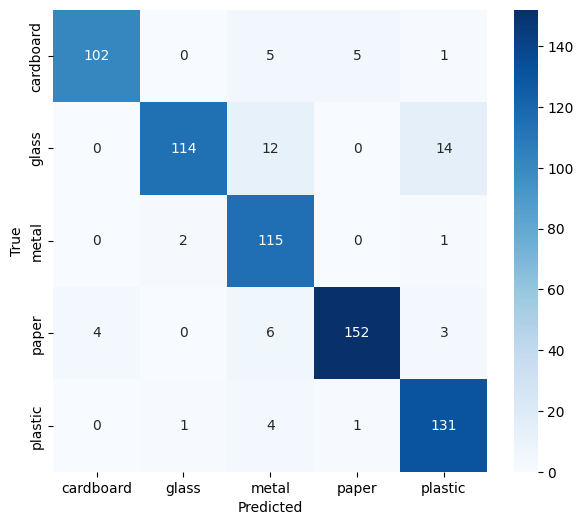

In [ ]:
# Evaluate and debug: confusion matrix
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

model = tf.keras.models.load_model("best_finetuned.h5")
preds = model.predict(test_gen, verbose=1)
y_pred = np.argmax(preds, axis=1)
y_true = test_gen.classes
print(classification_report(y_true, y_pred, target_names=labels))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(7,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('Predicted'); plt.ylabel('True'); plt.show()


Total misclassified: 59


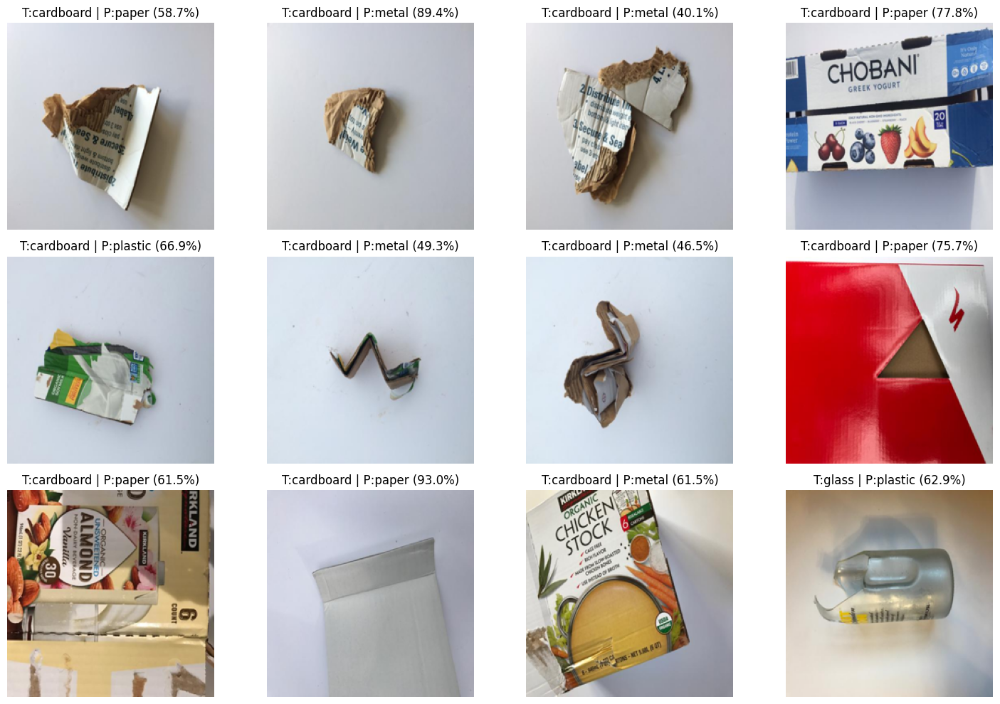

In [ ]:
# show some misclassified
mis_idx = np.where(y_pred != y_true)[0]
print("Total misclassified:", len(mis_idx))
def show_misclassified(n=12):
    sel = mis_idx[:n]
    plt.figure(figsize=(15,10))
    for i, idx in enumerate(sel):
        path = test_gen.filepaths[idx]
        img = Image.open(path).convert('RGB').resize(IMG_SIZE)
        plt.subplot(3,4,i+1)
        plt.imshow(img); plt.axis('off')
        plt.title(f"T:{labels[y_true[idx]]} | P:{labels[y_pred[idx]]} ({preds[idx].max()*100:.1f}%)")
    plt.tight_layout(); plt.show()

show_misclassified(12)


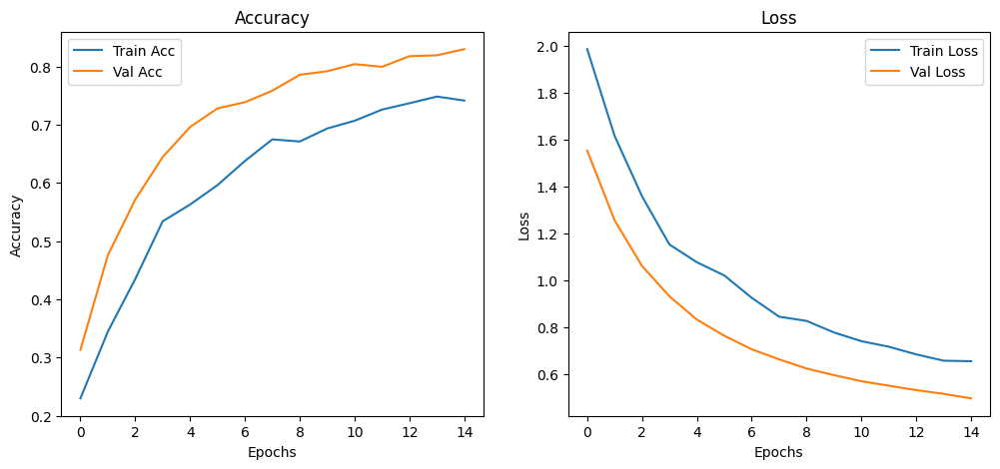

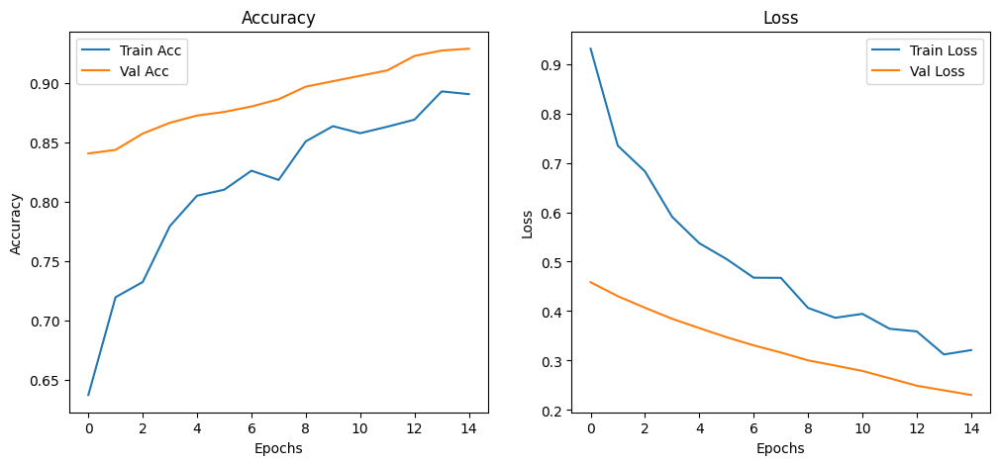

In [ ]:
# Visualize Training Progress
import matplotlib.pyplot as plt

def plot_history(history):
    plt.figure(figsize=(12,5))

    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='Train Acc')
    plt.plot(history.history['val_accuracy'], label='Val Acc')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.title("Accuracy")

    # Loss
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Loss")

    plt.show()

plot_history(history1)   # head training
plot_history(history2)   # fine-tuning


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


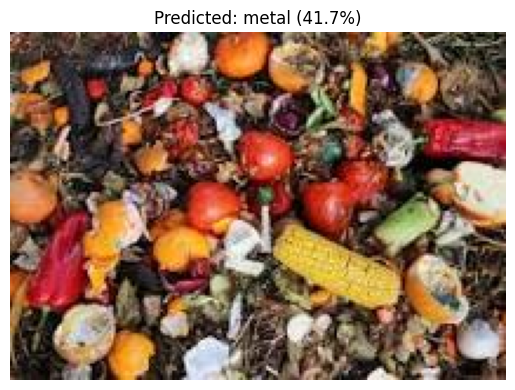

'metal'

In [ ]:
# Predict on New Images
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_and_show(img_path):
    # Load and preprocess
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)  # IMPORTANT: same preprocessing

    # Prediction
    preds = model.predict(img_array)
    idx = np.argmax(preds)
    label = labels[idx]
    confidence = preds[0][idx]

    # Show
    plt.imshow(image.load_img(img_path))
    plt.axis('off')
    plt.title(f"Predicted: {label} ({confidence*100:.1f}%)")
    plt.show()

    return label

# Example
predict_and_show("/content/download.jpeg")


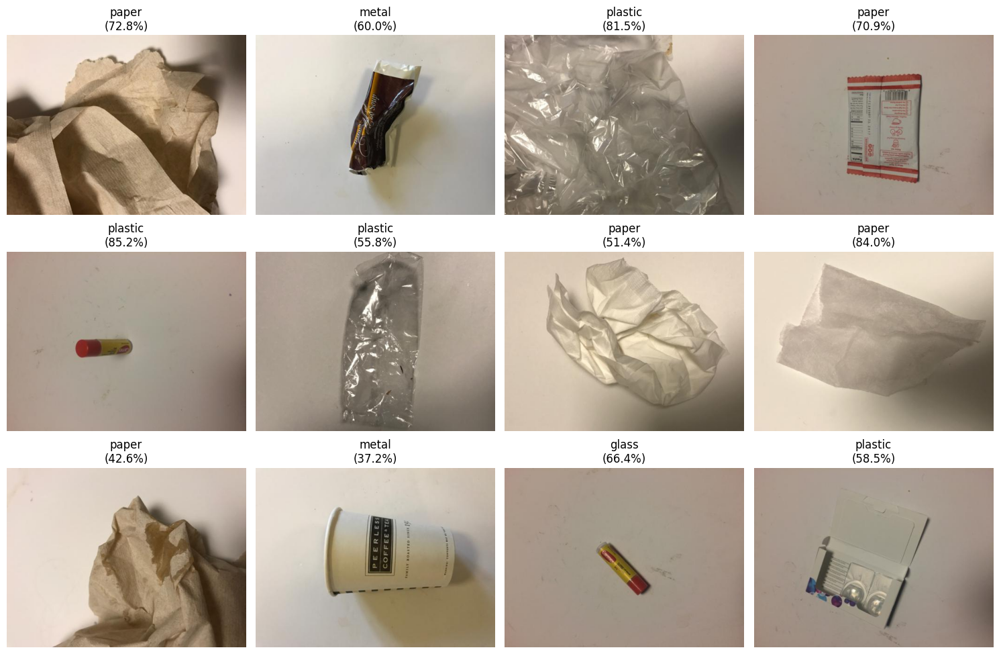

In [ ]:
def predict_and_show_grid(folder, max_images=12):
    files = [os.path.join(folder, f) for f in os.listdir(folder) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    files = files[:max_images]

    plt.figure(figsize=(15,10))
    for i, f in enumerate(files):
        img = image.load_img(f, target_size=IMG_SIZE)
        arr = image.img_to_array(img)
        arr = np.expand_dims(arr, axis=0)
        arr = preprocess_input(arr)

        preds = model.predict(arr, verbose=0)
        idx = np.argmax(preds)
        label = labels[idx]
        conf = preds[0][idx]

        plt.subplot(3,4,i+1)
        plt.imshow(image.load_img(f))
        plt.axis("off")
        plt.title(f"{label}\n({conf*100:.1f}%)")
    plt.tight_layout()
    plt.show()

# Example: show 12 images from plastic test folder
predict_and_show_grid("/content/drive/MyDrive/dataset-resized/trash", max_images=12)


In [ ]:
# Real-Time
import cv2

cap = cv2.VideoCapture(0)
while True:
    ret, frame = cap.read()
    if not ret: break

    # Preprocess
    img = cv2.resize(frame, IMG_SIZE)
    arr = np.expand_dims(img, axis=0)
    arr = preprocess_input(arr)

    preds = model.predict(arr, verbose=0)
    idx = np.argmax(preds)
    label = labels[idx]
    conf = preds[0][idx]

    cv2.putText(frame, f"{label} {conf*100:.1f}%", (10,40),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)

    cv2.imshow("Waste Classifier", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


In [ ]:
# Save
model.save("/content/drive/MyDrive/waste_classifier_mobilenet.h5")

# Load later
from tensorflow.keras.models import load_model
model = load_model("/content/drive/MyDrive/waste_classifier_mobilenet.h5")